<a href="https://colab.research.google.com/github/antoinexp/markov-chains-COM-516/blob/main/live_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import scipy.stats as st
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt

In [ ]:
!wget https://raw.githubusercontent.com/itewsh/mc/main/dataset1.csv
!wget https://raw.githubusercontent.com/itewsh/mc/main/dataset2.csv

--2020-12-17 12:36:48--  https://raw.githubusercontent.com/itewsh/mc/main/dataset1.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 140083 (137K) [text/plain]
Saving to: ‘dataset1.csv.3’

dataset1.csv.3      100%[===================>] 136.80K  --.-KB/s    in 0.01s   

2020-12-17 12:36:48 (12.7 MB/s) - ‘dataset1.csv.3’ saved [140083/140083]

--2020-12-17 12:36:48--  https://raw.githubusercontent.com/itewsh/mc/main/dataset2.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1769237 (1.7M) [text/plain]
Saving to: ‘dataset2.csv.3’

dataset2

In [ ]:
class Model(object):
  def __init__(self, df, verbose=False):
    self.verbose = verbose
    self.coordinates = df[["coordinates_x", "coordinates_y"]]._values
    self.costs = df["population"]._values
    #self.distance_matrix = sp.spatial.distance_matrix(self.coordinates, self.coordinates)
    self.N = len(df)
    self.r_dist = st.expon(0.,0.05)

  def sample_subset(self, n):
    return self.subset(*np.random.choice(self.N, size=n, replace=False))

  def sample_ball_subset(self):
    # takes 2 random points and fill in the points in the ball with this diameter
    l = list(np.random.choice(self.N, size=2, replace=False))
    middle = 0.5*(self.coordinates[l[0]] + self.coordinates[l[1]])
    radius = np.linalg.norm(self.coordinates[l[0]] - middle)
    for i in range(self.N):
      if not (i == l[0] or i == l[1]):
        if np.linalg.norm(self.coordinates[i] - middle) < radius:
          l.append(i)
    return self.subset(*l)

  def subset(self, *s):
    t = np.zeros(self.N, dtype="int")
    t[list(s)] = 1
    return t

  def get_convex_hull(self, state):
    idx_hull = self.get_convex_hull_id(state)
    return self.subset(*idx_hull)
  
  def get_convex_hull_id(self, state):
    if state.sum()<3:
      return state.nonzero()[0]
    hull = sp.spatial.ConvexHull(self.coordinates[state==1])
    idx_hull = (state.nonzero()[0])[hull.vertices]
    return idx_hull
    
  def get_extremal_points(self, state):
    hull_id = self.get_convex_hull_id(state)
    u,v = hull_id[0], hull_id[0]
    diameter = 0.
    for i in range(len(hull_id)):
      for j in range(i+1, len(hull_id)):
        new_diameter = np.linalg.norm(self.coordinates[hull_id[i]]-self.coordinates[hull_id[j]])
        if new_diameter > diameter:
          diameter = new_diameter
          u = hull_id[i]
          v = hull_id[j]
    return u,v,0.5*diameter

  def get_points_inside(self, middle, radius):
    return 1*(np.linalg.norm(model.coordinates - middle, axis=1) < radius)

  def objective_function(self, state, _lambda):
    #_old_f = 0.5*(self.distance_matrix*np.tensordot(state, state, 0)).max()
    _,_,f = self.get_extremal_points(state)
    return self.costs[state == 1].sum() - _lambda*self.N*np.pi*(f**2.)

  def temperature(self, t):
    #return np.exp(-10*t)
    return max(0.001, min(1, 1 - t))
    #return max(0.00001, min(1, 1 - t)**0.5)

  def acceptance_probability(self, cost, new_cost, temperature, K=1.):
    if new_cost > cost: 
      return 1
    else: # exploration
      p = np.exp(- K*(cost-new_cost) / temperature)
      return p

  def random_neighbour(self, state):
    new_state = state.copy()
    n_cities = state.sum()
    choice = np.random.rand()

    if n_cities == 0: #no cities => only add
      choice = 0.00001
    elif n_cities == len(state): #all cities => only remove
      choice = 0.99999

    u,v,r = self.get_extremal_points(state)
    middle = 0.5*(self.coordinates[u] + self.coordinates[v])

    epsilon = self.r_dist.rvs()

    if choice<=0.4: #add
      if self.verbose:
        print("add proposed")
      s0 = self.get_points_inside(middle, r+epsilon)
      s1 = self.get_points_inside(middle, r)
      s = np.bitwise_xor(s0, s1)
      if s.sum()>0:
        add_j = np.random.choice(s.nonzero()[0])
        tmp = self.get_points_inside(middle, np.linalg.norm(self.coordinates[add_j]-middle)+0.00001)
        new_state[:] = tmp
    elif choice<=0.6: #disturb
      new_middle = np.random.choice(np.random.choice((1-state).nonzero()[0]))
      tmp = self.get_points_inside(self.coordinates[new_middle], r+0.00001)
      new_state[:] = tmp
    elif choice<=1.: #remove
      if self.verbose:
        print("removed proposed")
      s0 = self.get_points_inside(middle, max(r-epsilon,0))
      s1 = self.get_points_inside(middle, r)
      s = np.bitwise_xor(s0, s1)
      if s.sum()>2:
        i,j = np.random.choice(s.nonzero()[0], size=2, replace=False)
        mm = 0.5*(self.coordinates[i] + self.coordinates[j])
        rr = np.linalg.norm(mm-self.coordinates[i])
        tmp = self.get_points_inside(mm, rr+0.00001)
        new_state[:] = tmp

    
    return new_state

  def score_with_all_cities(self, _lambda):
    all_subset = self.subset(*range(self.N))
    return self.objective_function(all_subset, _lambda)
  
  def best_score_with_one_city(self, _lambda):
    return (1./self.N)*max(self.costs)

  def run(self, state, _lambda = 1., max_steps=400, K=1., plot_step_size=-1):
    cost = self.objective_function(state, _lambda)
    self.history = []

    for step in range(max_steps):
      if plot_step_size>0 and step%plot_step_size==0:
        print(f"progress: {100.*step/max_steps:.2f}%, cost={cost:.4f}, percentage_cities={100*state.sum()/len(state):.2f}%")
        self.plot_state(state)

      fraction = step / float(max_steps)
      T = self.temperature(fraction)
      new_state = self.random_neighbour(state)
      new_cost = self.objective_function(new_state, _lambda)

      p = self.acceptance_probability(cost, new_cost, T, K)
      self.history.append(dict(step=step, n_cities=state.sum(), cost=cost, p_transition=p, new_cost=new_cost))

      if p > np.random.rand():
          if self.verbose:
            print(f"accepted [p={p}] cost={cost} n_states={state.sum()} new_cost={new_cost} n_new_states={new_state.sum()}")
          state, cost = new_state, new_cost
      else: 
        if self.verbose:
          print(f"refused [p={p}] cost={cost} n_states={state.sum()} new_cost={new_cost} n_new_states={new_state.sum()}")
    
    self.state = state

    # retrieve the best score
    index_best_score = 0
    for i in range(1,len(self.history)):
      if self.history[i]["cost"]>self.history[index_best_score]["cost"]:
        index_best_score = i

    return index_best_score

  def plot_history(self):
    df = pd.DataFrame(self.history)
    df["cost"].plot()
    plt.grid(True)
    plt.show()

    plt.axhline(y=self.N, color='r', linestyle='--', linewidth=1)
    df["n_cities"].plot()
    plt.ylim(0, self.N*(1.01))
    plt.grid(True)
    plt.show()
  
  def plot_state(self, state):
    plt.figure()
    plt.figure(figsize=(7,7))
    plt.scatter(self.coordinates[:,0], self.coordinates[:,1], s=0.1*self.costs, c=list(map(float, state)), cmap="rainbow")
    plt.xlim(0., 1.)
    plt.ylim(0., 1.)
    
    if state.sum()>=3:
      coordinates_subset = self.coordinates[state==1]
      hull = sp.spatial.ConvexHull(coordinates_subset)
      v = np.append(hull.vertices, hull.vertices[0])
      plt.plot(coordinates_subset[v][:,0],coordinates_subset[v][:,1],  color="black")
    plt.show()

-818.2292374409362 0.023499803843383394
progress: 0.00%, cost=35.8851, percentage_cities=8.30%


<Figure size 432x288 with 0 Axes>

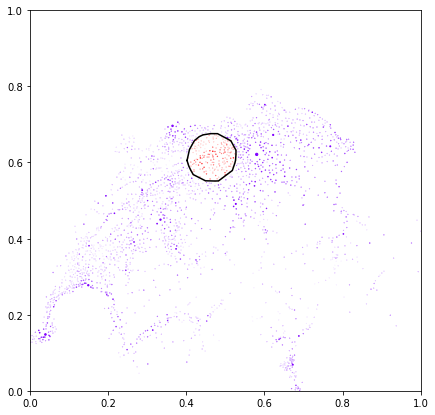

progress: 1.00%, cost=46.8928, percentage_cities=10.67%


<Figure size 432x288 with 0 Axes>

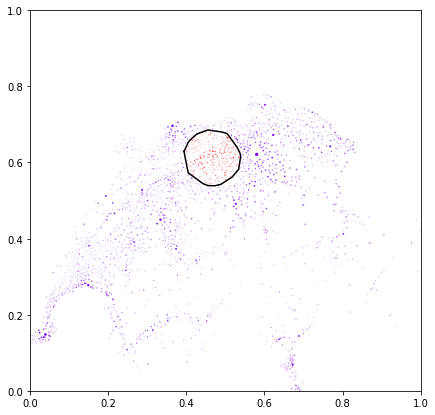

progress: 2.00%, cost=46.8928, percentage_cities=10.67%


<Figure size 432x288 with 0 Axes>

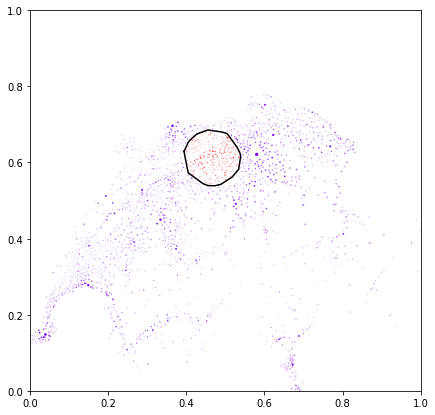

progress: 3.00%, cost=46.8928, percentage_cities=10.67%


<Figure size 432x288 with 0 Axes>

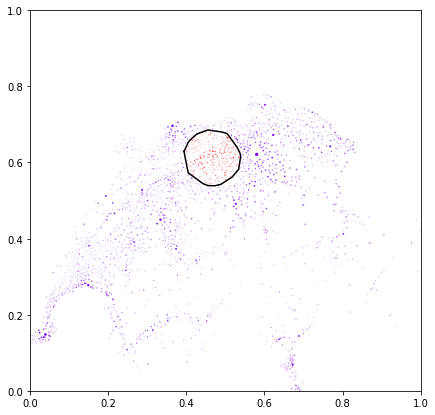

progress: 4.00%, cost=46.8928, percentage_cities=10.67%


<Figure size 432x288 with 0 Axes>

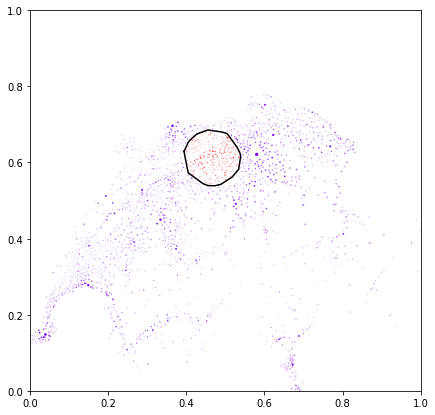

progress: 5.00%, cost=46.8928, percentage_cities=10.67%


<Figure size 432x288 with 0 Axes>

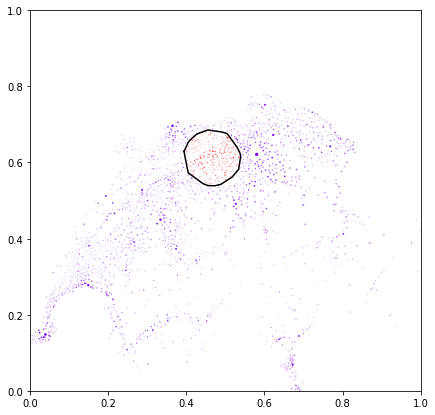

progress: 6.00%, cost=48.0350, percentage_cities=10.71%


<Figure size 432x288 with 0 Axes>

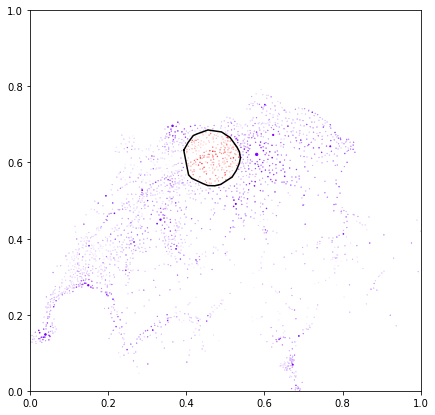

progress: 7.00%, cost=48.0350, percentage_cities=10.71%


<Figure size 432x288 with 0 Axes>

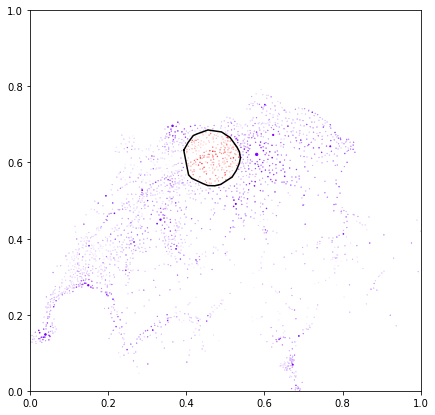

progress: 8.00%, cost=68.8340, percentage_cities=15.04%


<Figure size 432x288 with 0 Axes>

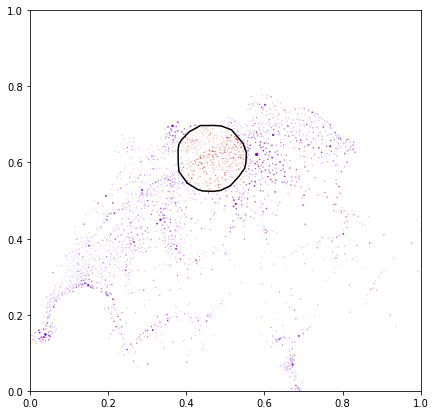

progress: 9.00%, cost=68.8340, percentage_cities=15.04%


<Figure size 432x288 with 0 Axes>

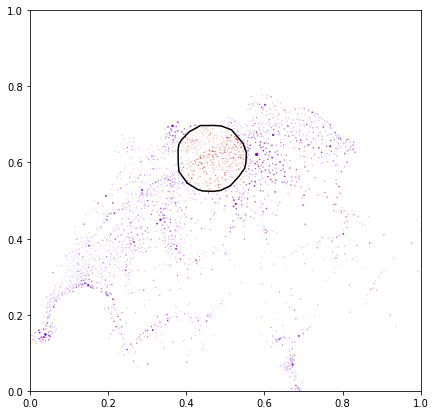

progress: 10.00%, cost=68.8340, percentage_cities=15.04%


<Figure size 432x288 with 0 Axes>

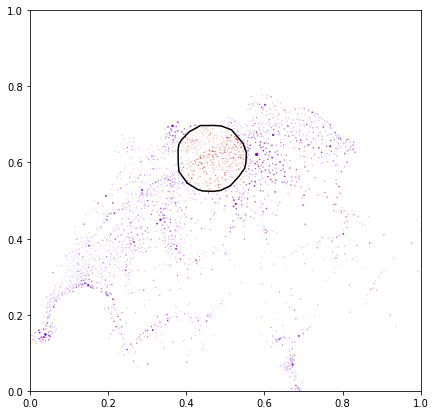

progress: 11.00%, cost=68.8340, percentage_cities=15.04%


<Figure size 432x288 with 0 Axes>

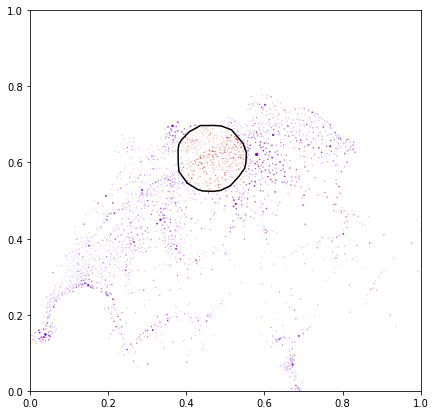

progress: 12.00%, cost=68.8340, percentage_cities=15.04%


<Figure size 432x288 with 0 Axes>

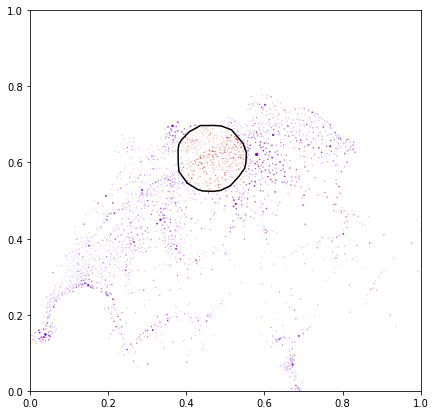

progress: 13.00%, cost=68.8340, percentage_cities=15.04%


<Figure size 432x288 with 0 Axes>

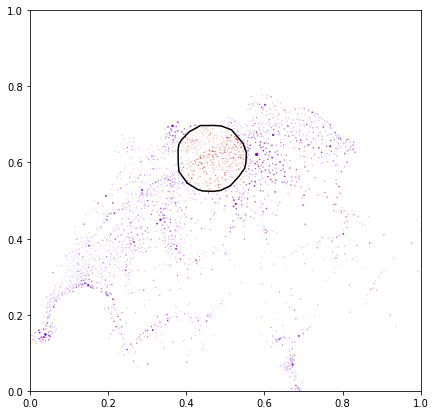

progress: 14.00%, cost=82.0793, percentage_cities=18.21%


<Figure size 432x288 with 0 Axes>

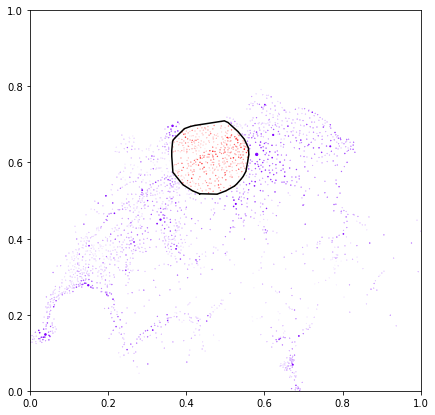

progress: 15.00%, cost=163.3777, percentage_cities=23.88%


<Figure size 432x288 with 0 Axes>

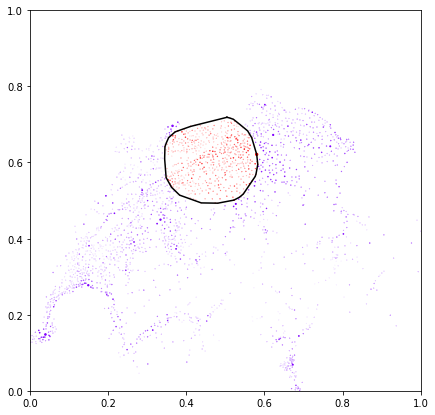

progress: 16.00%, cost=163.3777, percentage_cities=23.88%


<Figure size 432x288 with 0 Axes>

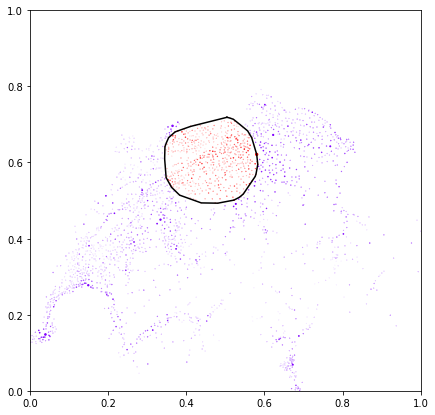

progress: 17.00%, cost=163.3777, percentage_cities=23.88%


<Figure size 432x288 with 0 Axes>

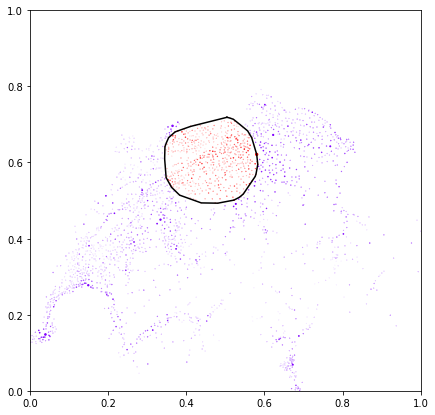

progress: 18.00%, cost=172.0257, percentage_cities=25.09%


<Figure size 432x288 with 0 Axes>

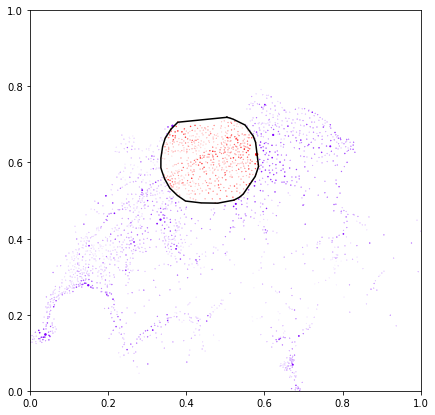

progress: 19.00%, cost=172.0257, percentage_cities=25.09%


<Figure size 432x288 with 0 Axes>

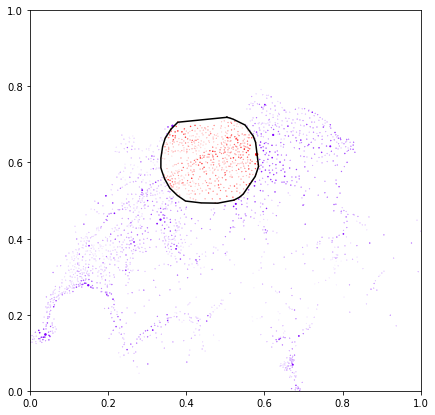

progress: 20.00%, cost=172.0257, percentage_cities=25.09%


<Figure size 432x288 with 0 Axes>

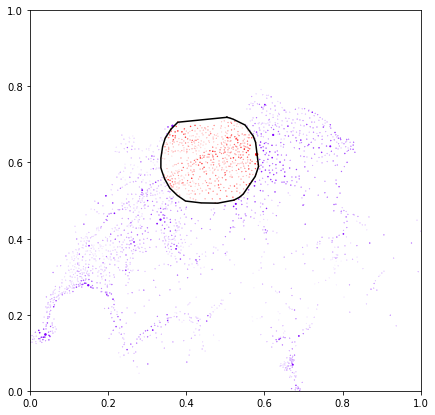

progress: 21.00%, cost=175.0583, percentage_cities=23.53%


<Figure size 432x288 with 0 Axes>

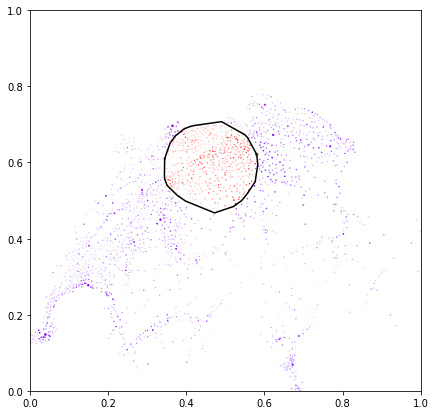

progress: 22.00%, cost=175.0583, percentage_cities=23.53%


<Figure size 432x288 with 0 Axes>

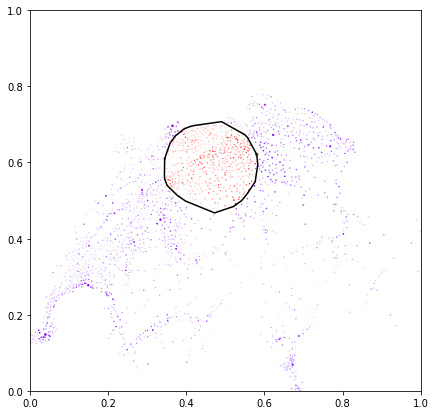

progress: 23.00%, cost=175.0583, percentage_cities=23.53%


<Figure size 432x288 with 0 Axes>

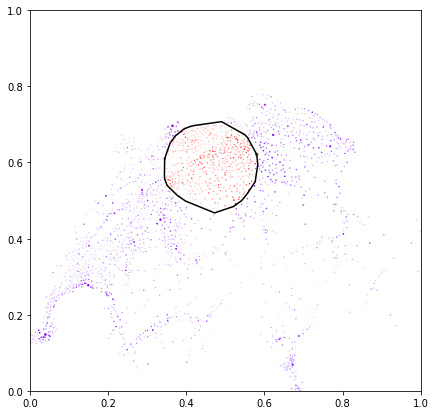

progress: 24.00%, cost=195.9844, percentage_cities=26.92%


<Figure size 432x288 with 0 Axes>

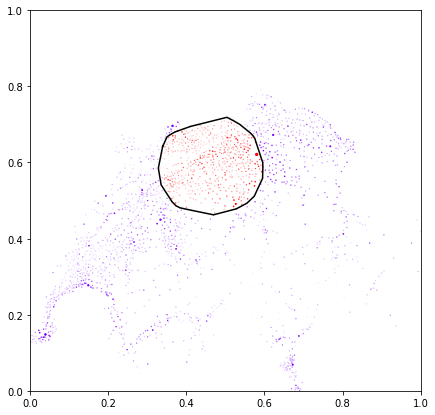

progress: 25.00%, cost=243.0038, percentage_cities=20.98%


<Figure size 432x288 with 0 Axes>

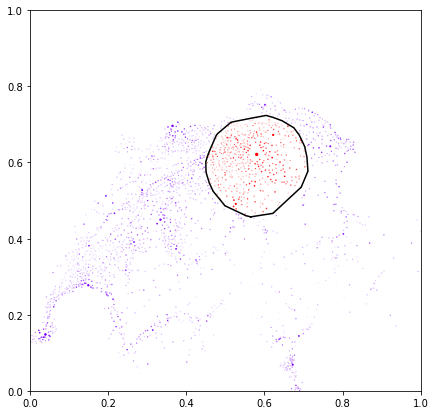

progress: 26.00%, cost=243.0038, percentage_cities=20.98%


<Figure size 432x288 with 0 Axes>

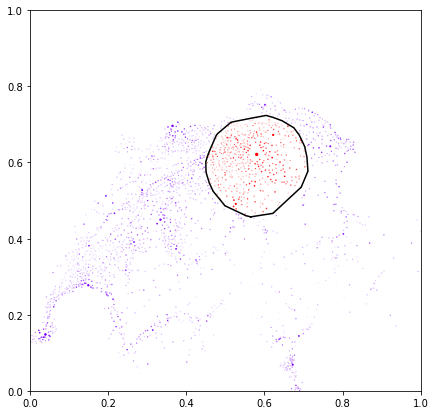

progress: 27.00%, cost=243.0038, percentage_cities=20.98%


<Figure size 432x288 with 0 Axes>

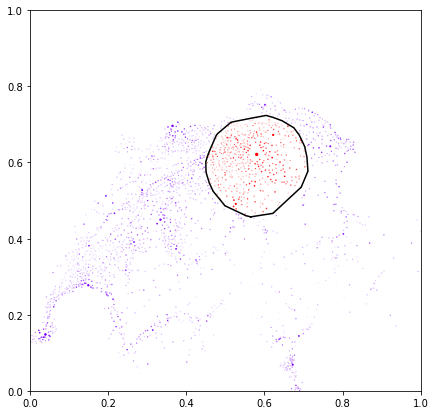

progress: 28.00%, cost=246.6195, percentage_cities=24.15%


<Figure size 432x288 with 0 Axes>

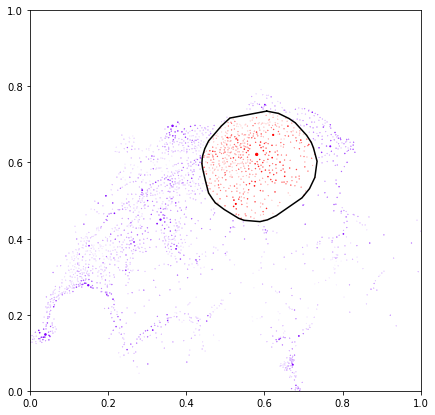

progress: 29.00%, cost=246.6195, percentage_cities=24.15%


<Figure size 432x288 with 0 Axes>

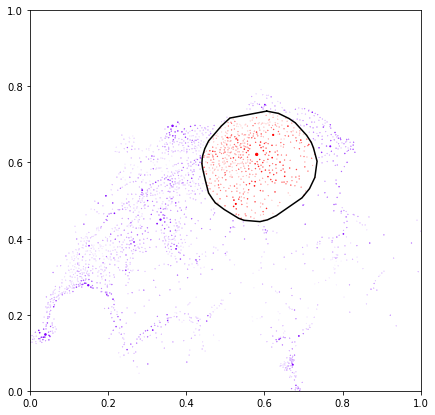

progress: 30.00%, cost=246.6195, percentage_cities=24.15%


<Figure size 432x288 with 0 Axes>

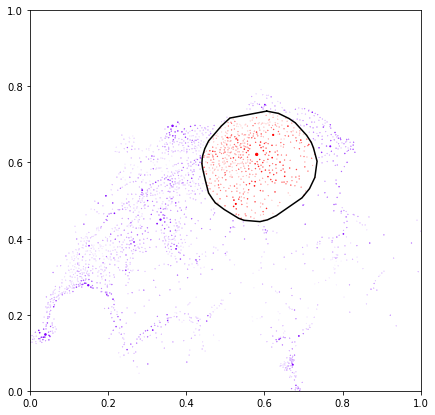

progress: 31.00%, cost=246.6195, percentage_cities=24.15%


<Figure size 432x288 with 0 Axes>

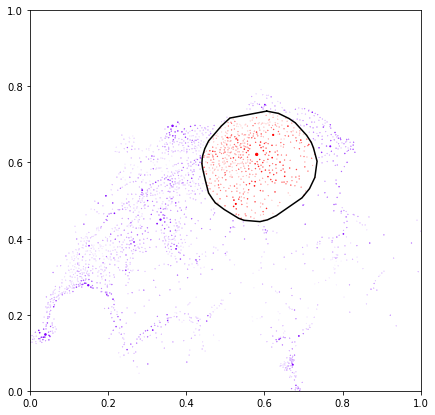

progress: 32.00%, cost=246.6195, percentage_cities=24.15%


<Figure size 432x288 with 0 Axes>

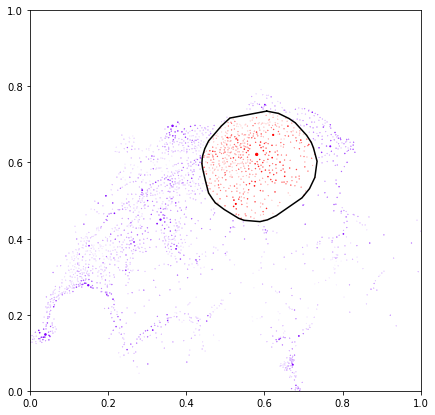

progress: 33.00%, cost=246.6195, percentage_cities=24.15%


<Figure size 432x288 with 0 Axes>

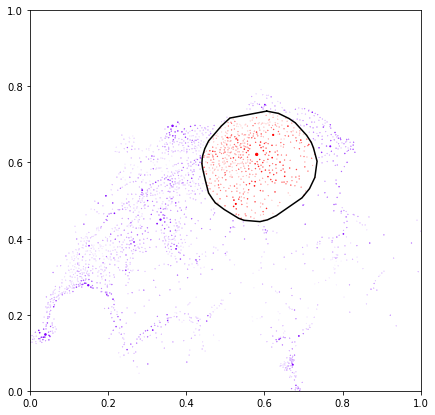

progress: 34.00%, cost=246.6195, percentage_cities=24.15%


<Figure size 432x288 with 0 Axes>

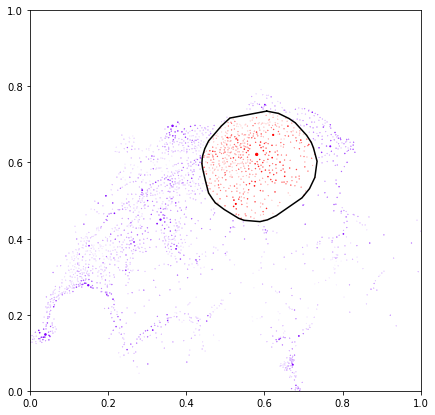

progress: 35.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

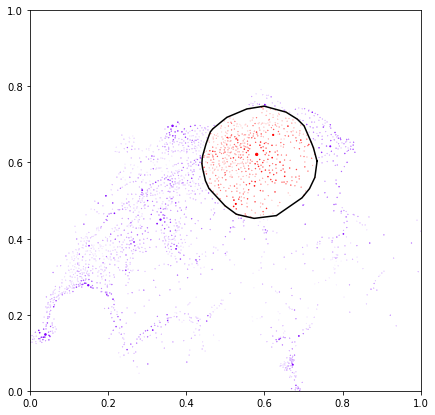

progress: 36.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

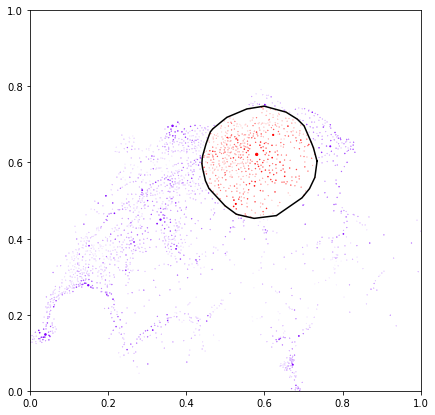

progress: 37.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

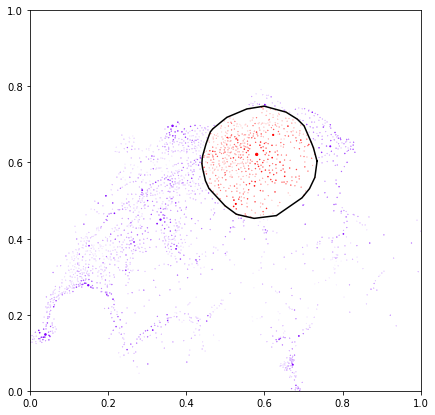

progress: 38.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

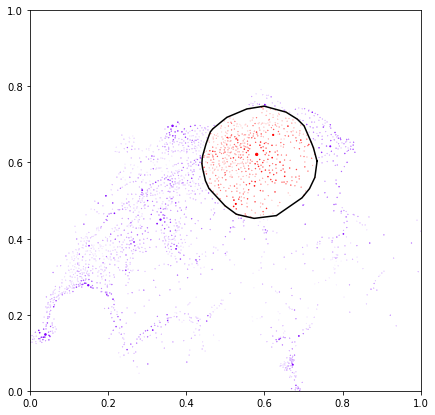

progress: 39.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

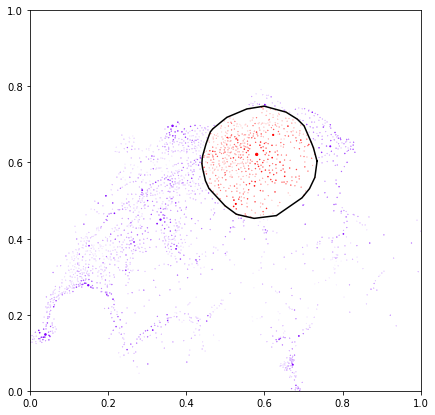

progress: 40.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

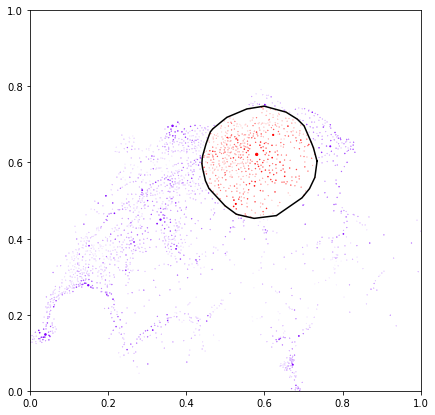

progress: 41.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

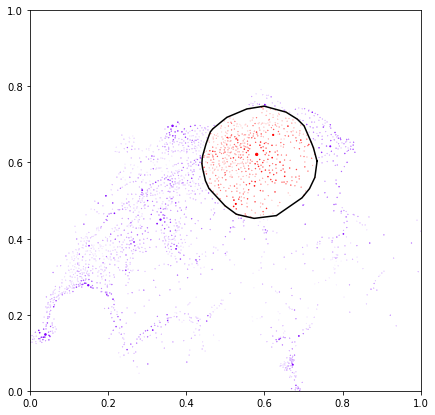

progress: 42.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

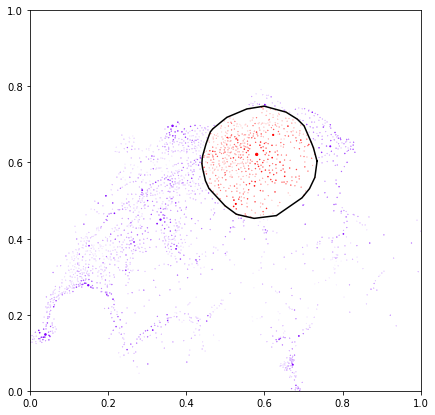

progress: 43.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

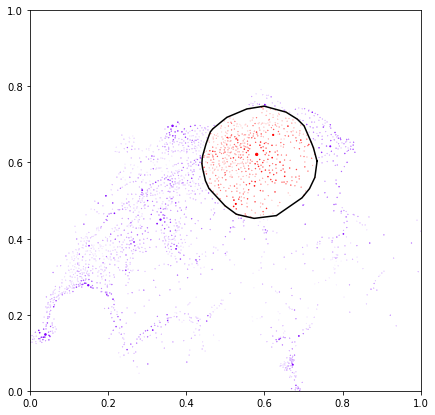

progress: 44.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

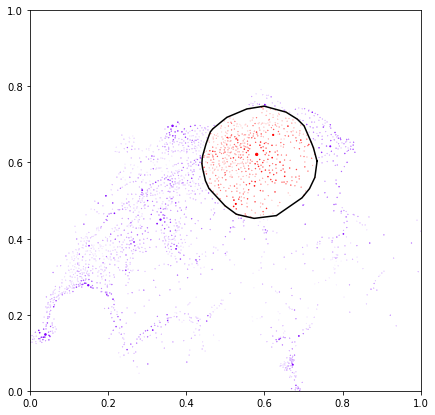

progress: 45.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

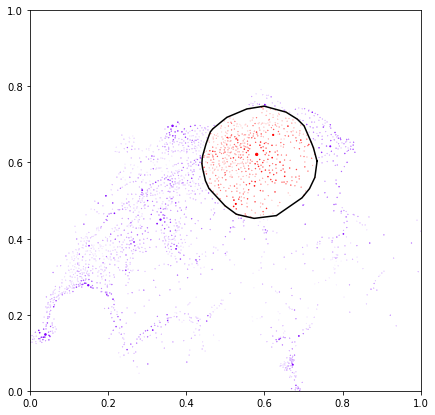

progress: 46.00%, cost=246.4780, percentage_cities=24.60%


<Figure size 432x288 with 0 Axes>

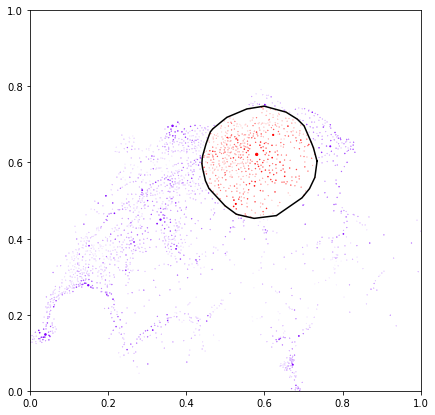

progress: 47.00%, cost=251.1856, percentage_cities=26.03%


<Figure size 432x288 with 0 Axes>

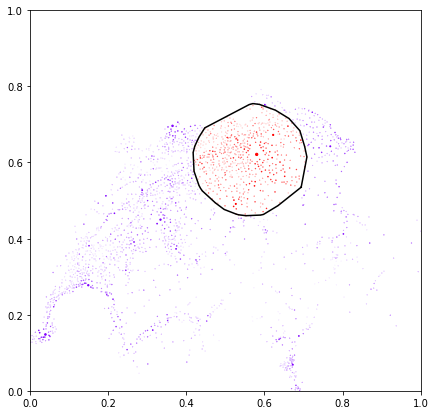

progress: 48.00%, cost=251.1856, percentage_cities=26.03%


<Figure size 432x288 with 0 Axes>

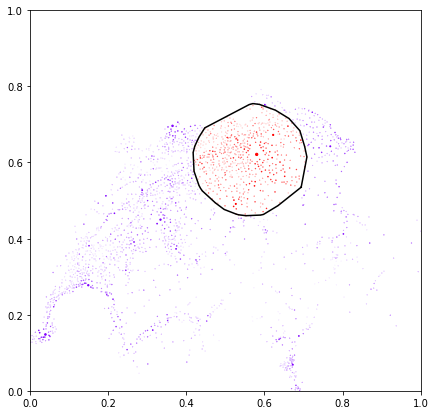

progress: 49.00%, cost=251.1856, percentage_cities=26.03%


<Figure size 432x288 with 0 Axes>

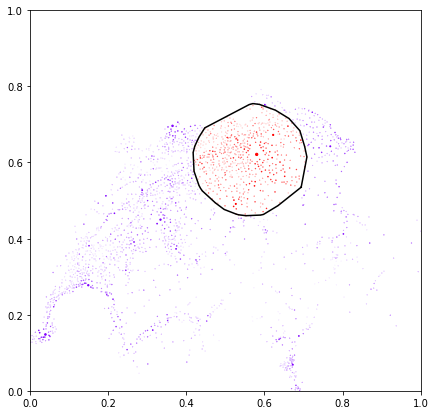

progress: 50.00%, cost=251.1856, percentage_cities=26.03%


<Figure size 432x288 with 0 Axes>

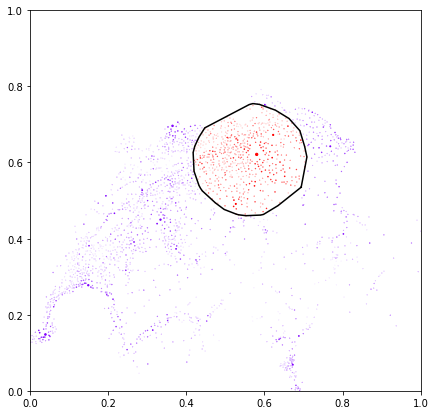

progress: 51.00%, cost=251.1856, percentage_cities=26.03%


<Figure size 432x288 with 0 Axes>

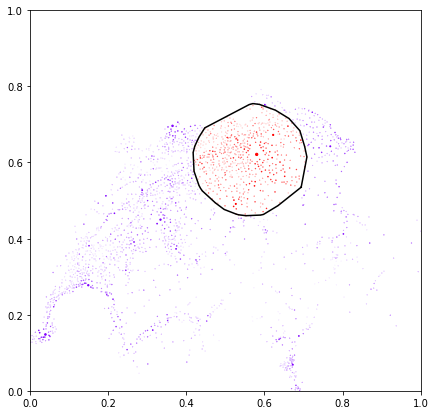

progress: 52.00%, cost=251.5906, percentage_cities=26.07%


<Figure size 432x288 with 0 Axes>

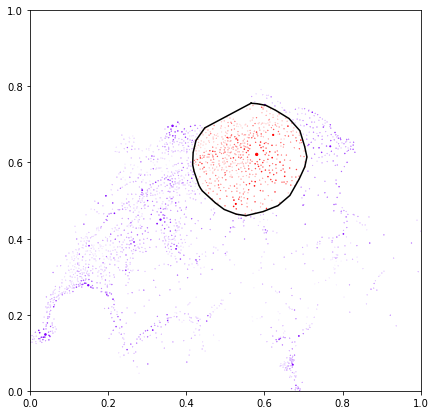

progress: 53.00%, cost=251.5906, percentage_cities=26.07%


<Figure size 432x288 with 0 Axes>

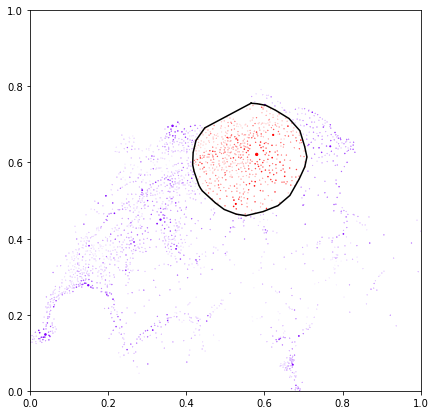

progress: 54.00%, cost=251.5906, percentage_cities=26.07%


<Figure size 432x288 with 0 Axes>

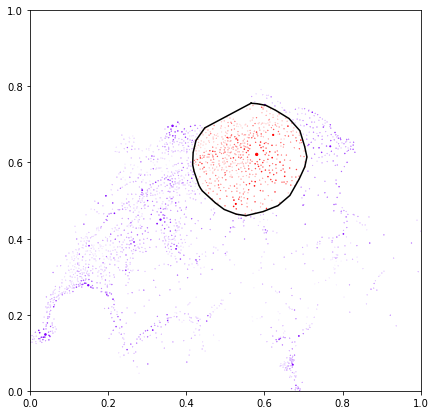

progress: 55.00%, cost=251.5906, percentage_cities=26.07%


<Figure size 432x288 with 0 Axes>

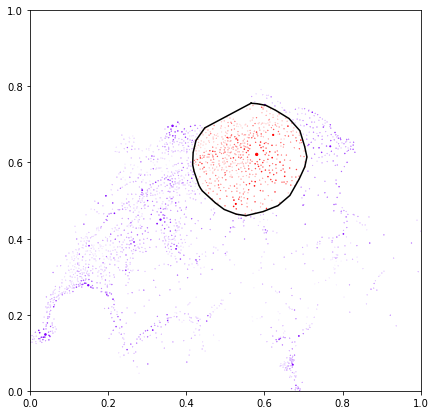

progress: 56.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

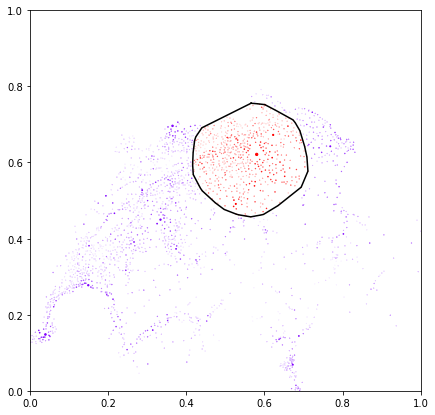

progress: 57.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

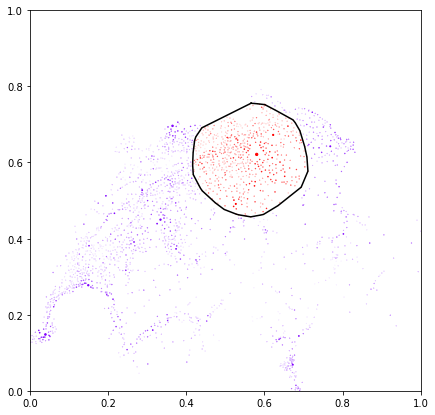

progress: 58.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

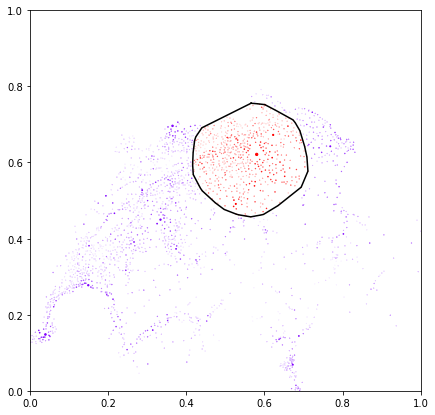

progress: 59.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

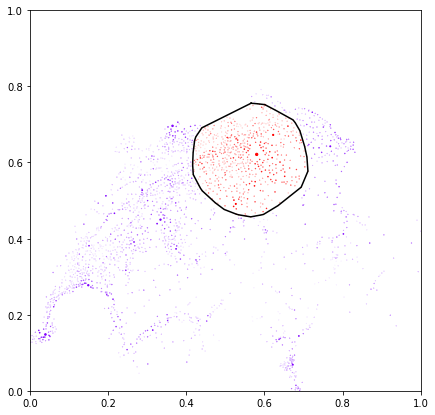

progress: 60.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

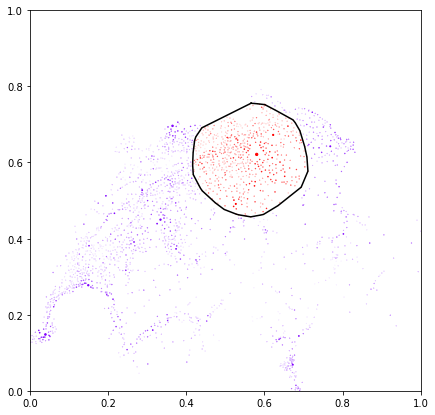

progress: 61.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

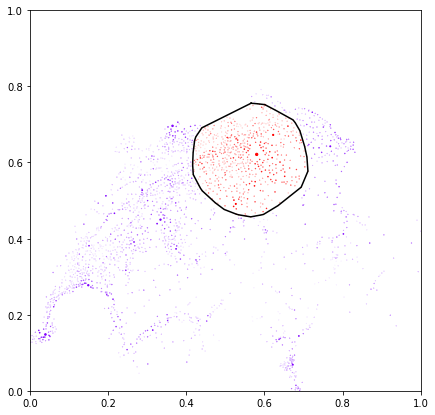

progress: 62.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

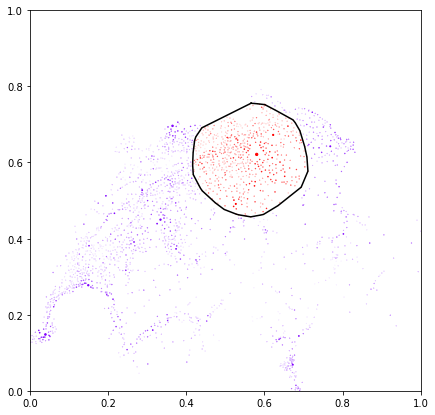

progress: 63.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

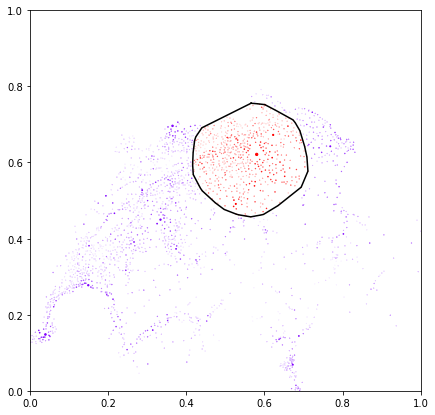

progress: 64.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

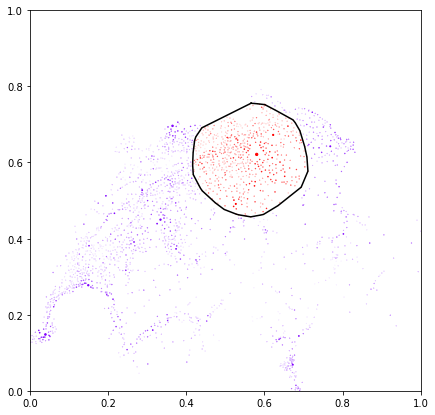

progress: 65.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

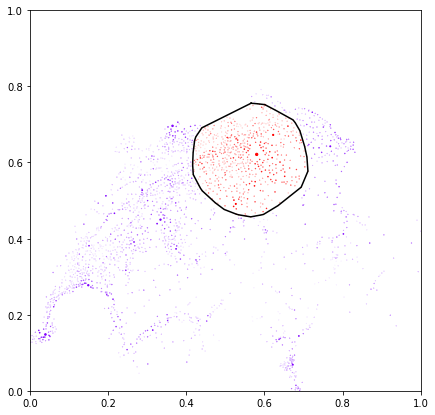

progress: 66.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

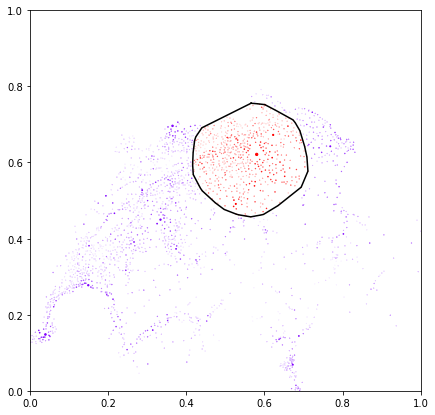

progress: 67.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

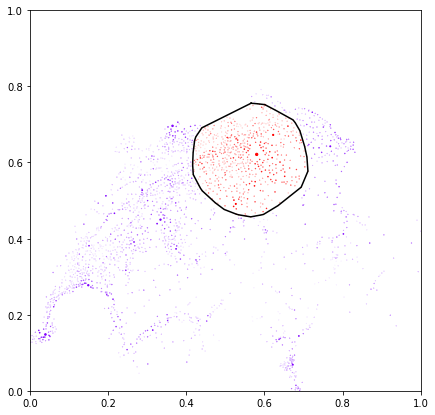

progress: 68.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

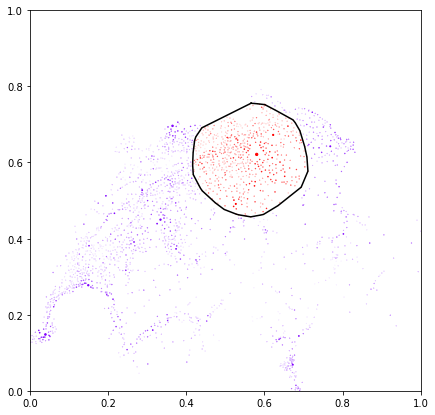

progress: 69.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

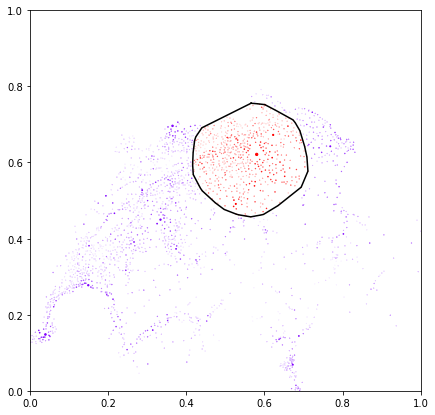

progress: 70.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

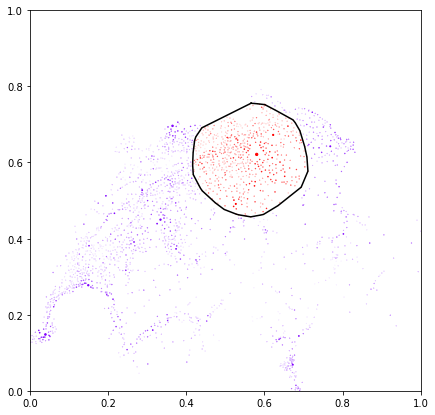

progress: 71.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

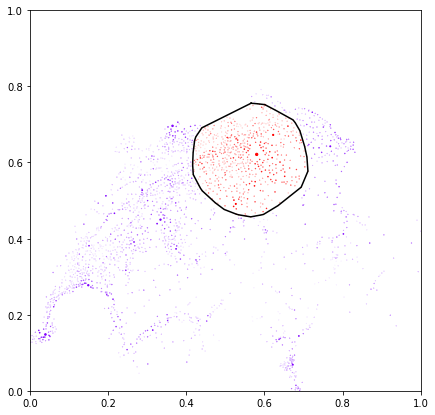

progress: 72.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

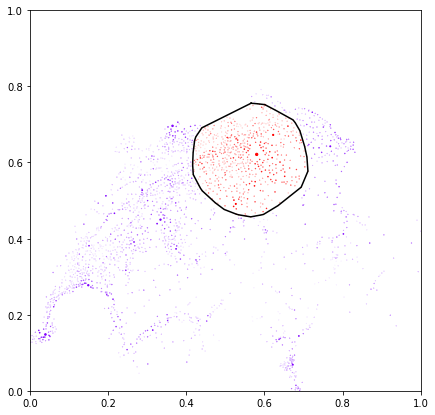

progress: 73.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

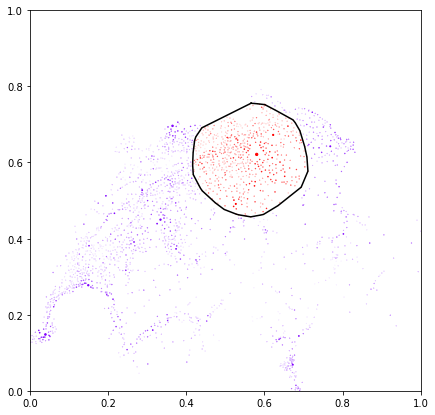

progress: 74.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

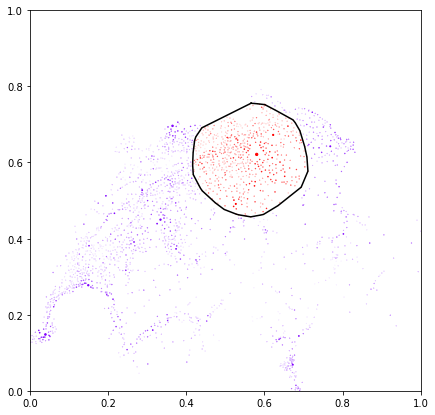

progress: 75.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

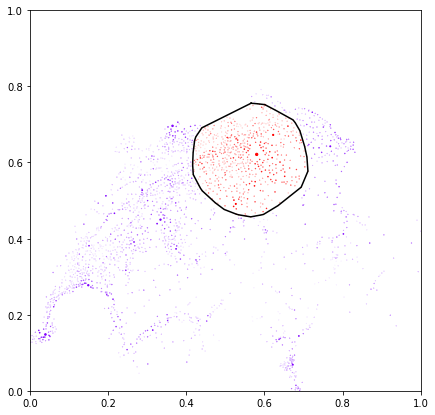

progress: 76.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

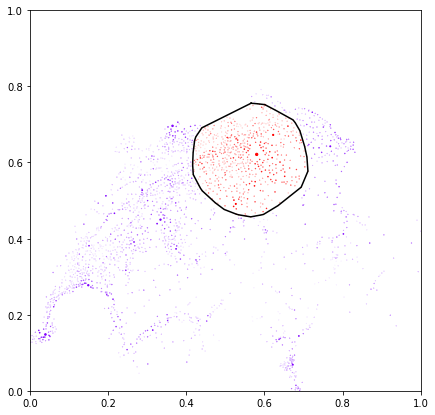

progress: 77.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

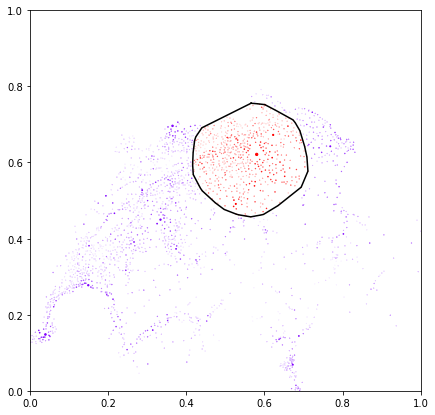

progress: 78.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

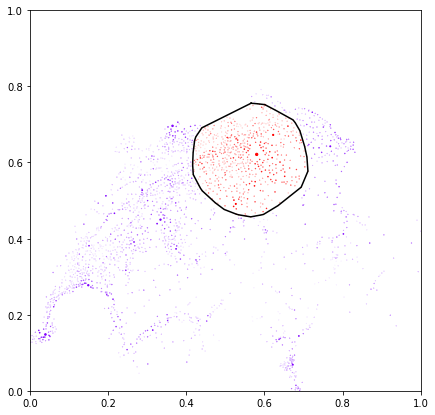

progress: 79.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

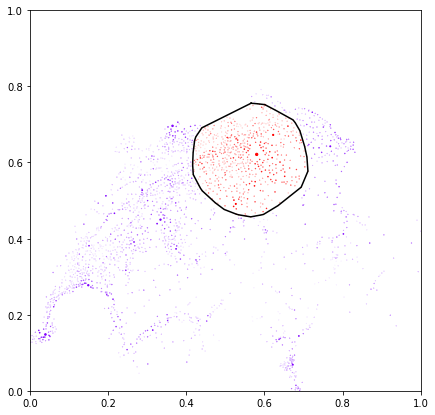

progress: 80.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

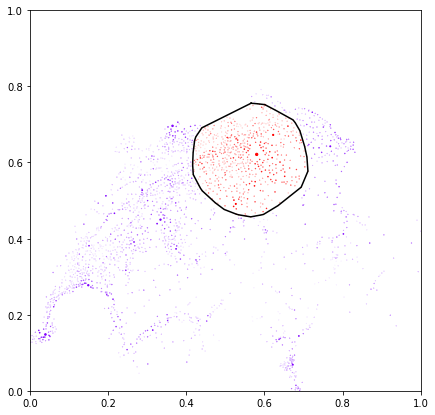

progress: 81.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

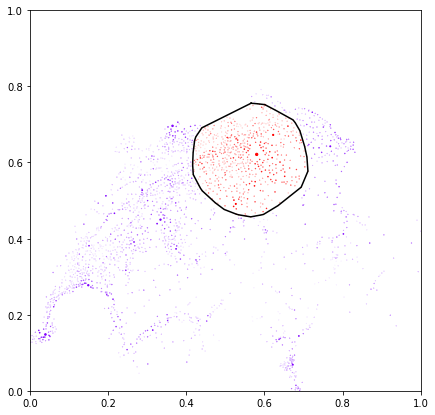

progress: 82.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

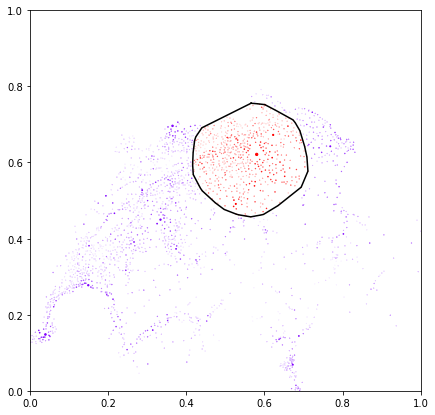

progress: 83.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

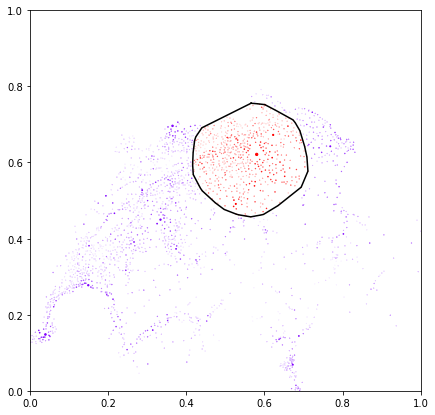

progress: 84.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

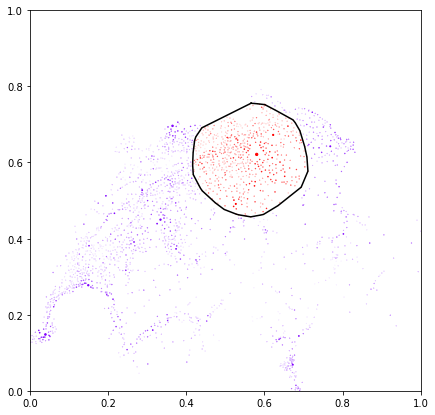

progress: 85.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

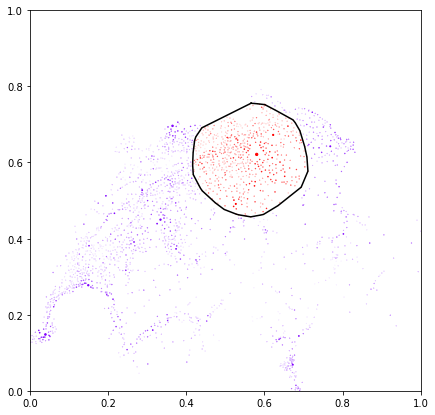

progress: 86.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

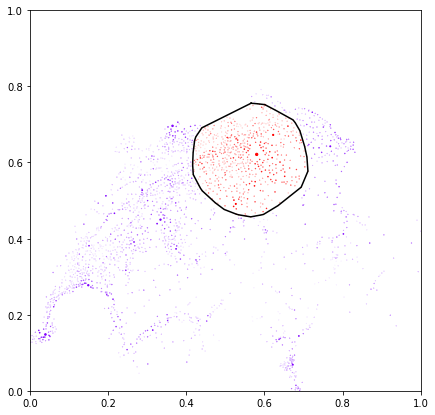

progress: 87.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

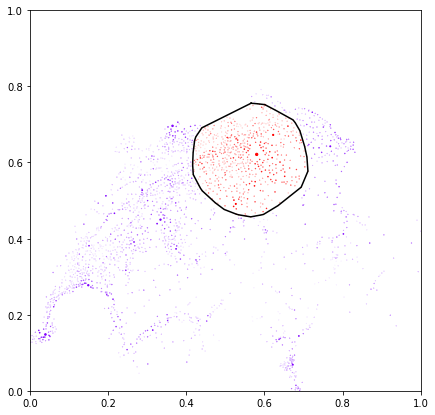

progress: 88.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

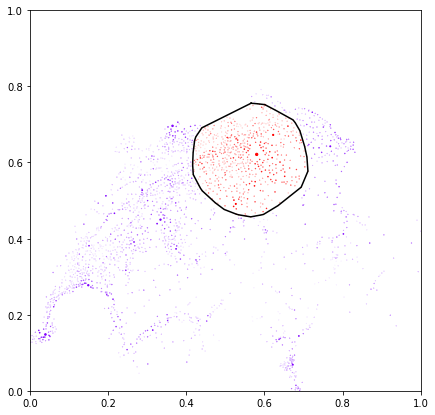

progress: 89.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

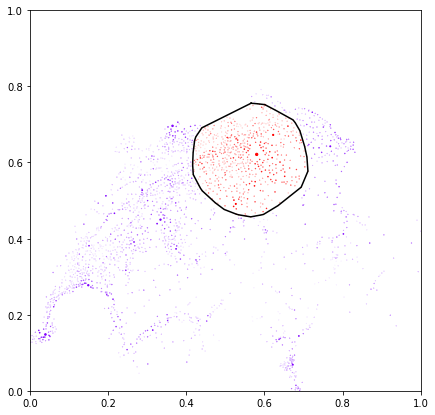

progress: 90.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

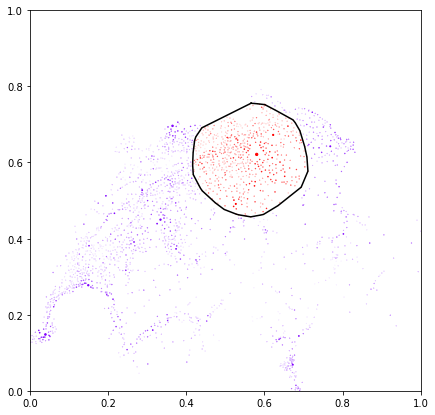

progress: 91.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

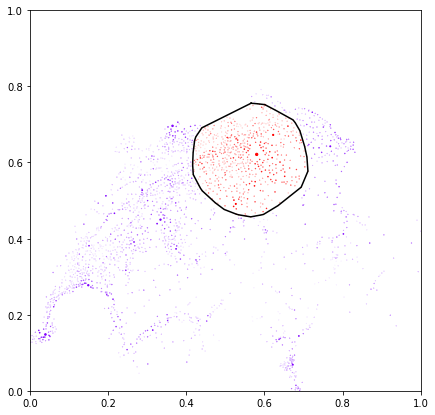

progress: 92.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

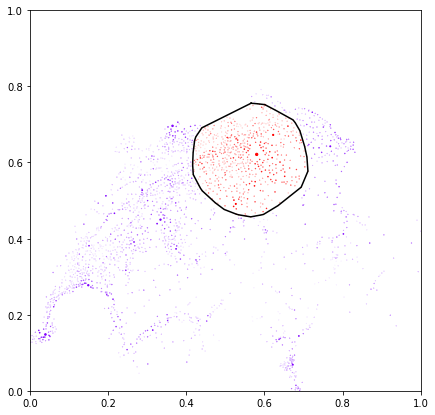

progress: 93.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

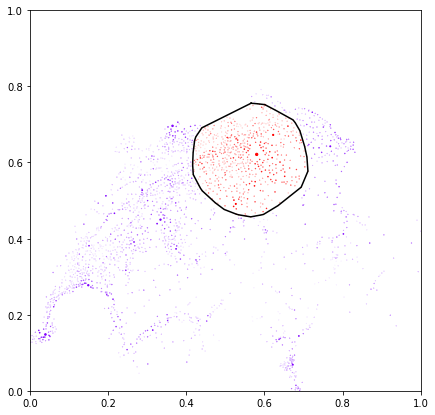

progress: 94.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

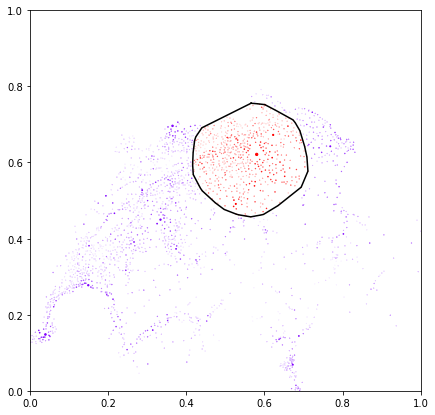

progress: 95.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

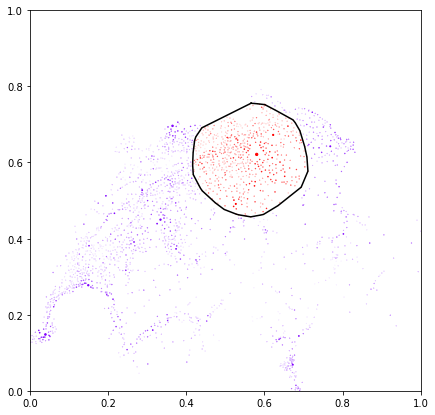

progress: 96.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

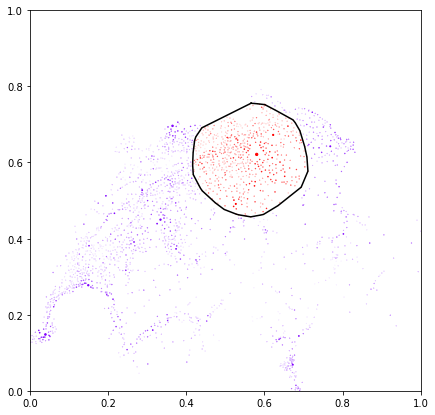

progress: 97.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

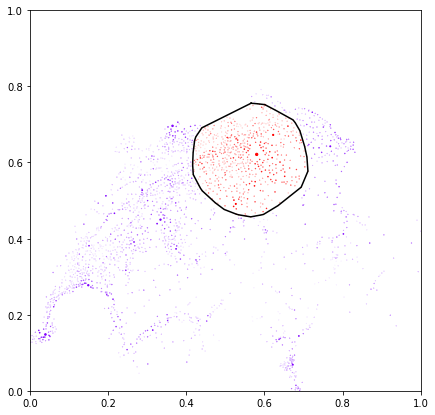

progress: 98.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

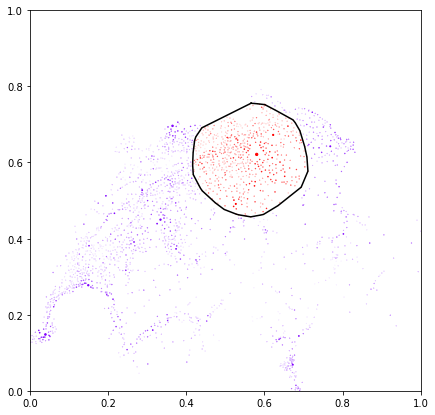

progress: 99.00%, cost=254.7929, percentage_cities=26.74%


<Figure size 432x288 with 0 Axes>

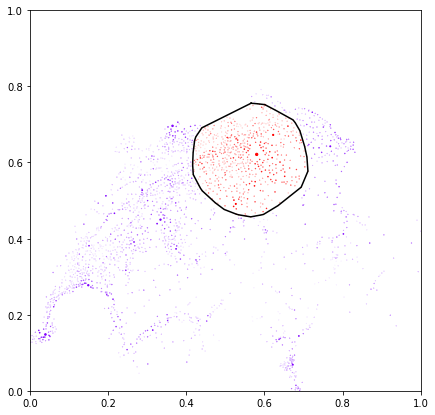

56 {'step': 56, 'n_cities': 599, 'cost': 254.79287977747518, 'p_transition': 8.627002386810988e-09, 'new_cost': 246.62279753179402}


In [ ]:
_lambda = 1.0
dataset = pd.read_csv("dataset1.csv").set_index("id")
model = Model(dataset)
print(model.score_with_all_cities(_lambda), model.best_score_with_one_city(_lambda))
start_state = model.sample_ball_subset()
i = model.run(start_state, _lambda = _lambda, max_steps=100, K=1., plot_step_size=1)
print(i, model.history[i])

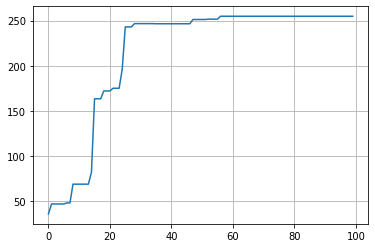

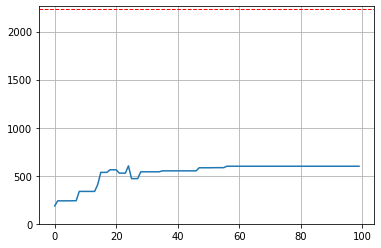

In [ ]:
model.plot_history()

-6076.074085394375 0.040976306246791494
progress: 0.00%, cost=1062.9477, percentage_cities=10.94%


<Figure size 432x288 with 0 Axes>

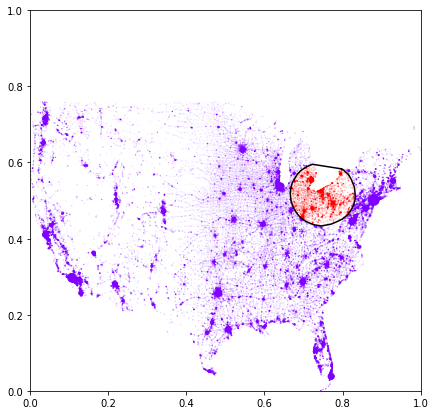

progress: 2.50%, cost=6215.4682, percentage_cities=38.24%


<Figure size 432x288 with 0 Axes>

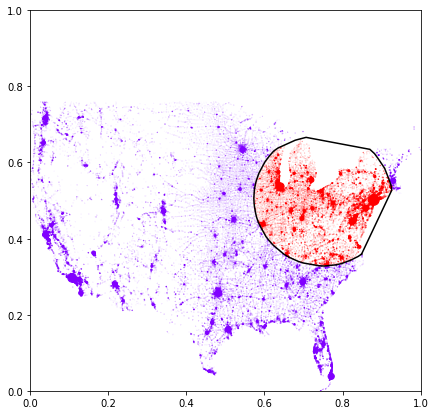

progress: 5.00%, cost=6823.7199, percentage_cities=41.38%


<Figure size 432x288 with 0 Axes>

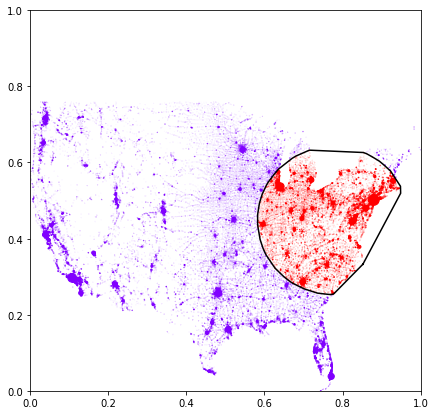

progress: 7.50%, cost=6823.7199, percentage_cities=41.38%


<Figure size 432x288 with 0 Axes>

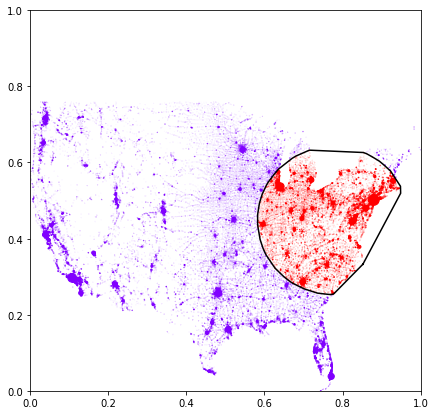

progress: 10.00%, cost=6823.7199, percentage_cities=41.38%


<Figure size 432x288 with 0 Axes>

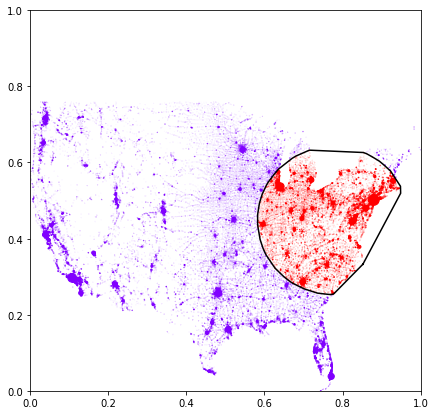

progress: 12.50%, cost=6823.7199, percentage_cities=41.38%


<Figure size 432x288 with 0 Axes>

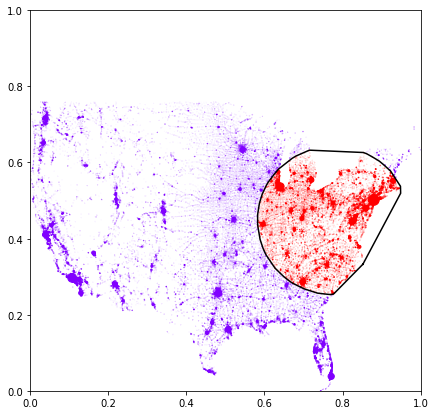

progress: 15.00%, cost=6881.8412, percentage_cities=40.74%


<Figure size 432x288 with 0 Axes>

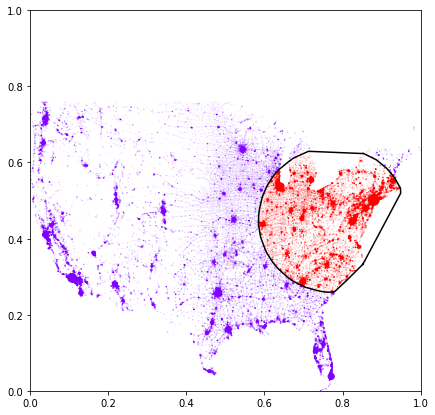

progress: 17.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

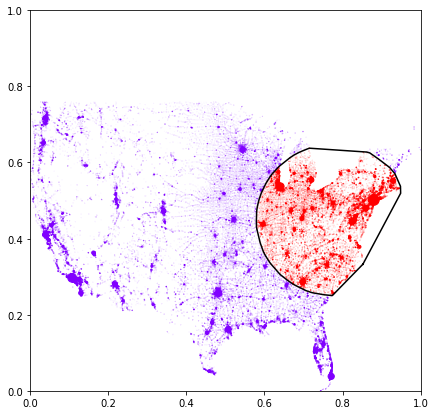

progress: 20.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

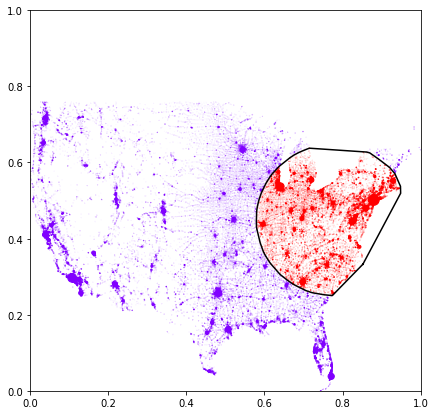

progress: 22.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

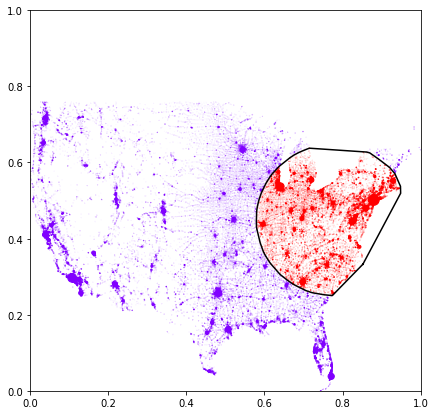

progress: 25.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

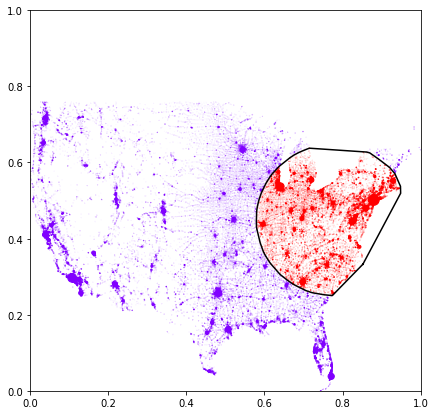

progress: 27.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

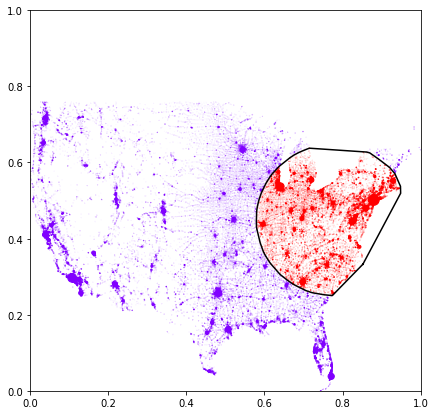

progress: 30.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

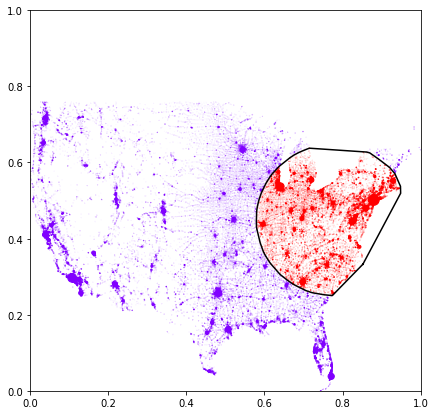

progress: 32.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

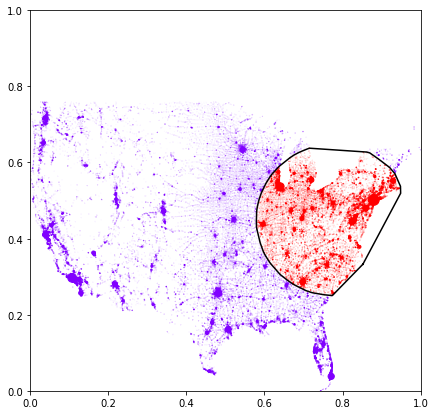

progress: 35.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

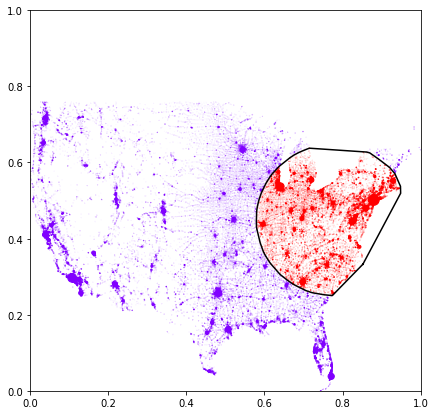

progress: 37.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

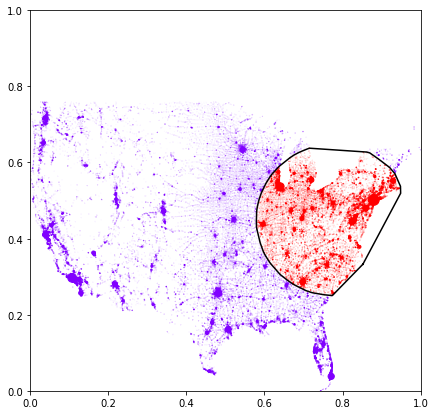

progress: 40.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

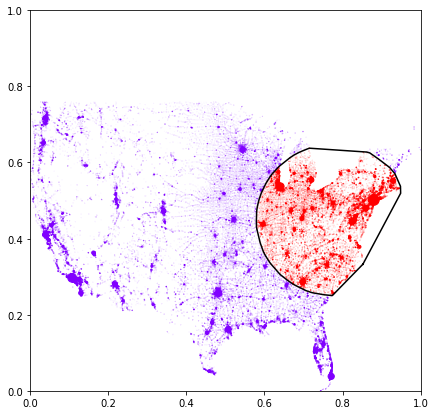

progress: 42.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

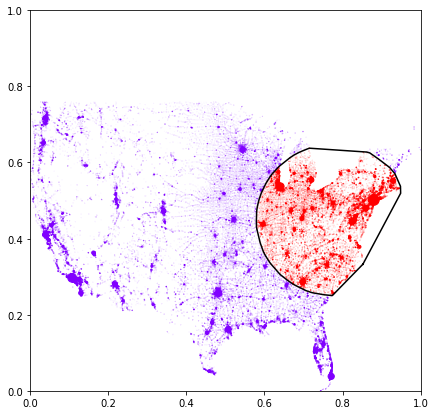

progress: 45.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

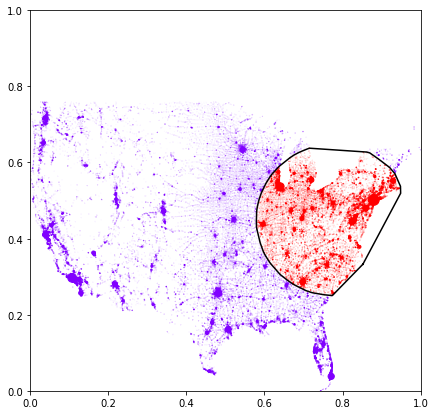

progress: 47.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

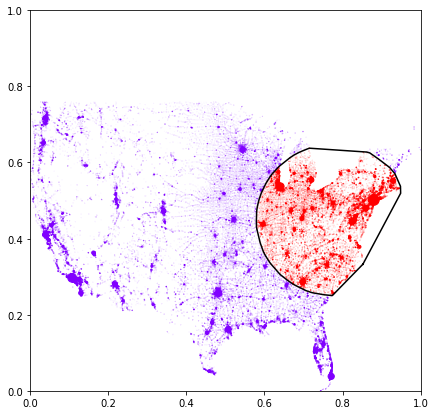

progress: 50.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

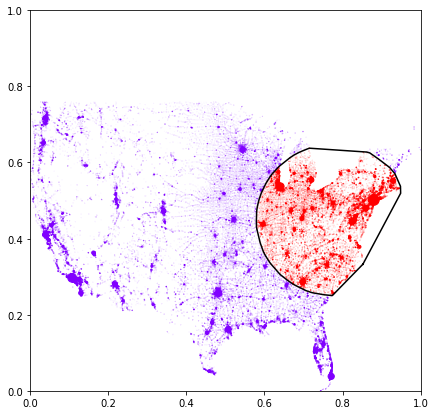

progress: 52.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

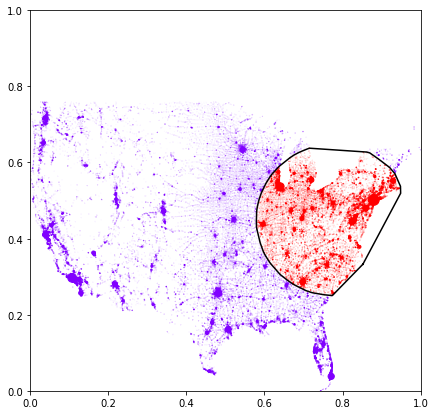

progress: 55.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

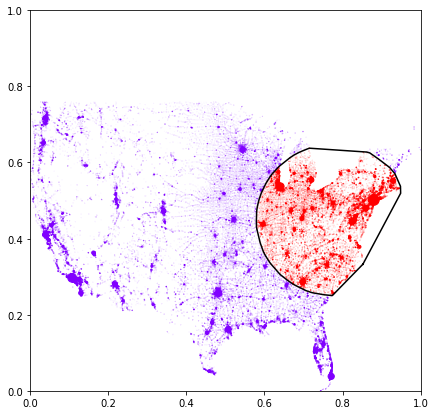

progress: 57.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

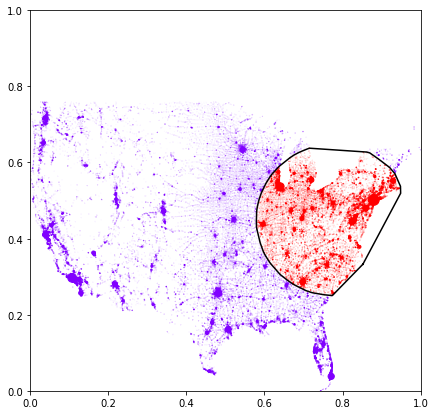

progress: 60.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

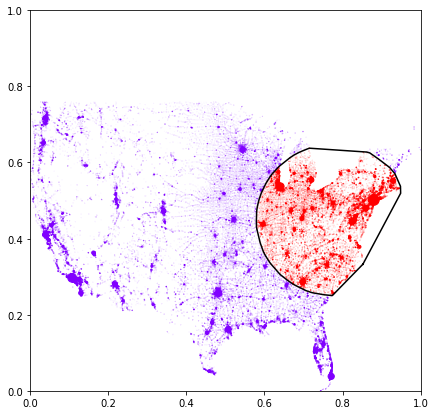

progress: 62.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

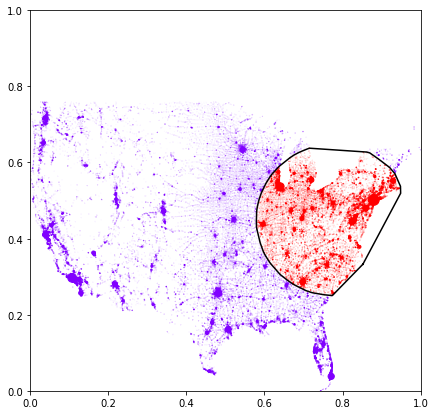

progress: 65.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

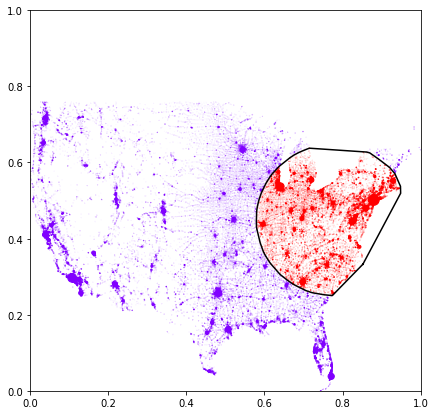

progress: 67.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

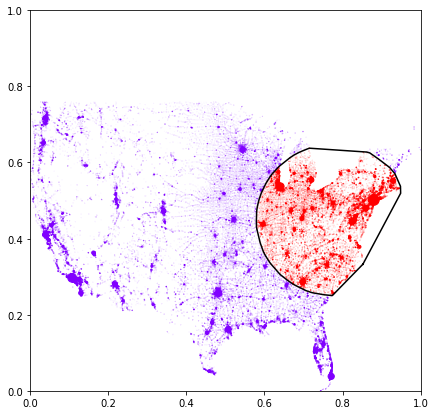

progress: 70.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

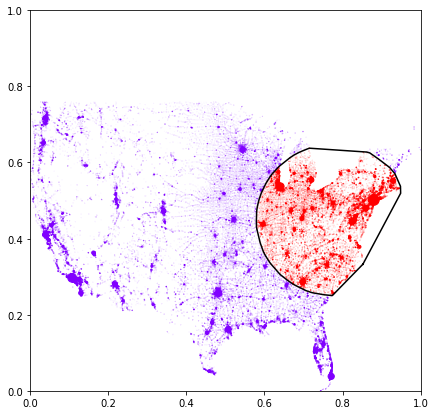

progress: 72.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

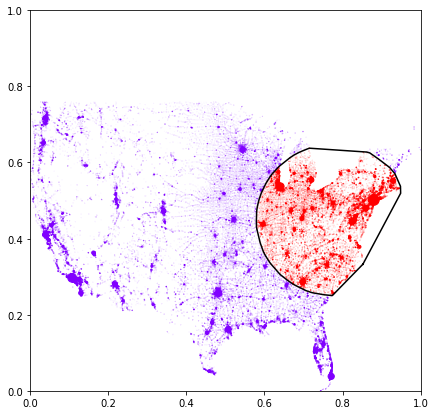

progress: 75.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

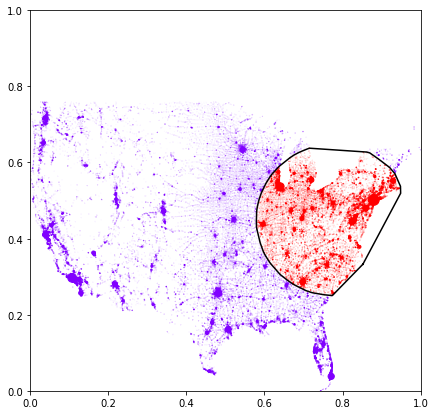

progress: 77.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

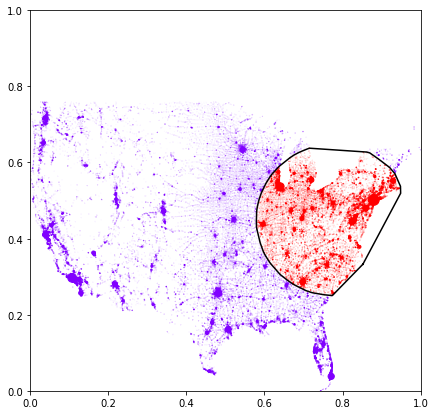

progress: 80.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

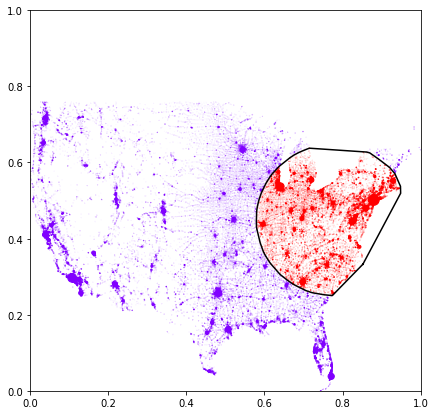

progress: 82.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

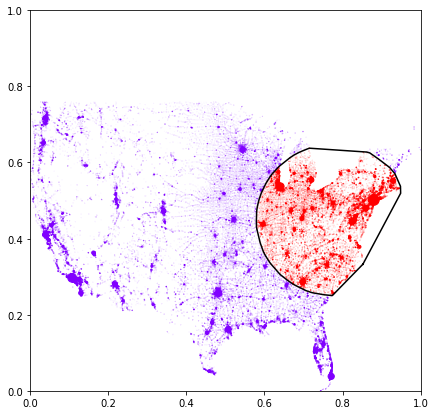

progress: 85.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

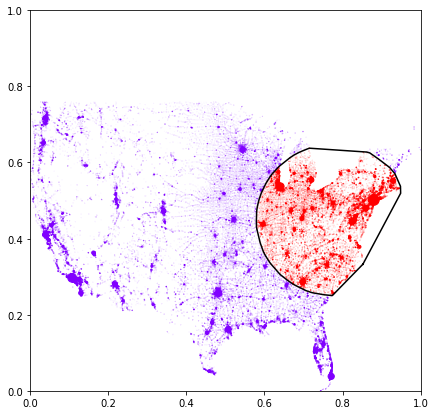

progress: 87.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

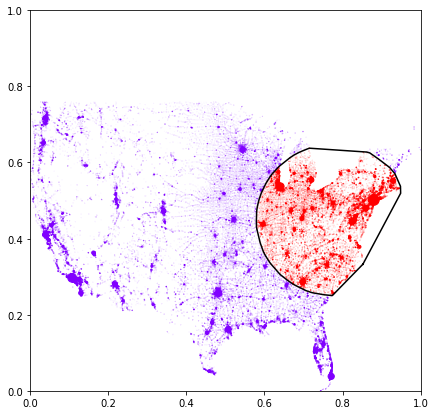

progress: 90.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

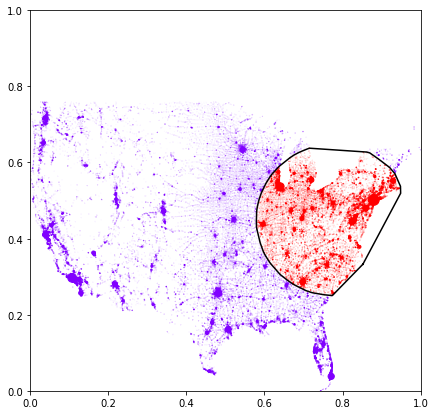

progress: 92.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

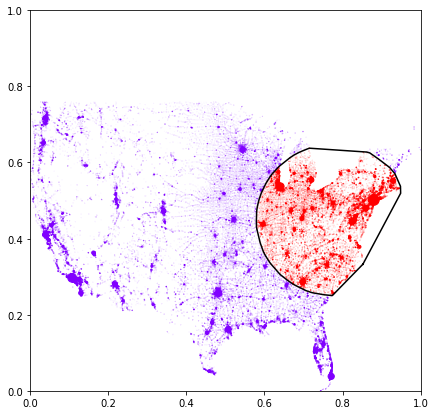

progress: 95.00%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

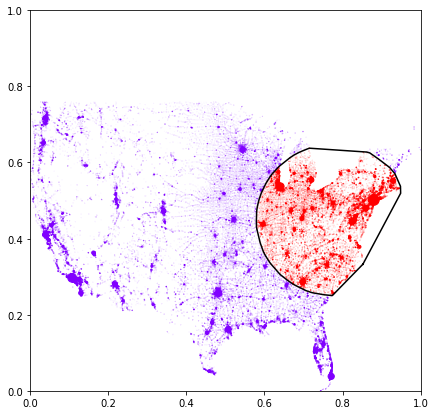

progress: 97.50%, cost=6724.4811, percentage_cities=41.96%


<Figure size 432x288 with 0 Axes>

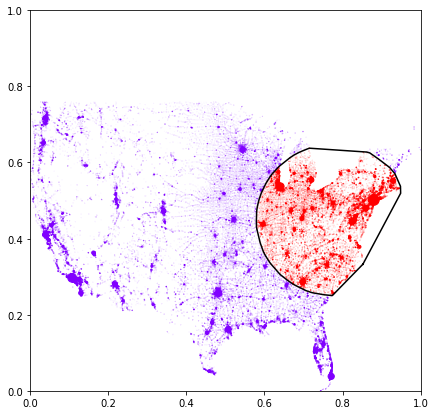

60 {'step': 60, 'n_cities': 11266, 'cost': 6881.841221360576, 'p_transition': 0.4125219539503504, 'new_cost': 6806.576623861883}


In [ ]:
_lambda = 1.25
dataset = pd.read_csv("dataset2.csv").set_index("id")
model = Model(dataset)
print(model.score_with_all_cities(_lambda), model.best_score_with_one_city(_lambda))
start_state = model.sample_ball_subset()
i = model.run(start_state, _lambda = _lambda, max_steps=400, K=0.01, plot_step_size=10)
print(i, model.history[i])

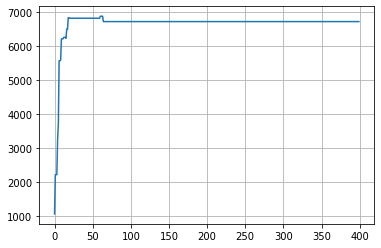

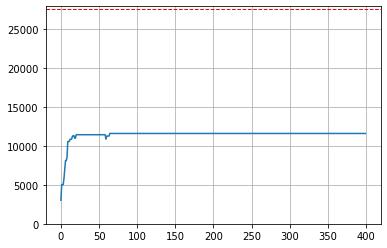

In [ ]:
model.plot_history()